# Data Mining Final Project
### Grant Gittes
### Tejasvi Medi
### Shubhrika Sehgal

## Data Import / Cleaning

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import sys
import numpy as np

In [2]:
pd.options.display.max_columns=None

In [3]:
dataset=pd.read_csv("listings.csv")
zip_data=pd.read_csv("MedianZIP.csv")

In [4]:
pd.set_option("display.max_rows", None)
dataset.shape
dataset.isnull().sum()
for column in dataset:
    if(dataset[column].isnull().sum()>=9000):
        dataset.drop([column],axis=1,inplace=True)
dataset.shape

(38481, 89)

In [5]:
dataset2=dataset.drop(columns=['id','country','scrape_id','require_guest_profile_picture','require_guest_phone_verification',
                               'host_name','host_id','host_listings_count','latitude','longitude','minimum_minimum_nights',
                               'maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights',
                               'minimum_nights_avg_ntm','maximum_nights_avg_ntm','availability_60','availability_90',
                               'availability_365','number_of_reviews_ltm','listing_url','host_has_profile_pic',
                               'last_scraped','experiences_offered','picture_url','host_url','host_thumbnail_url',
                               'host_picture_url','street','neighbourhood_cleansed','neighbourhood','neighbourhood_group_cleansed',
                               'market','country_code','has_availability','host_location','host_neighbourhood','city','is_location_exact',
                               'calendar_updated','has_availability','calendar_last_scraped','is_business_travel_ready','first_review','last_review',
                               'state','smart_location','host_verifications','property_type','name','summary','description'],
                      axis=1)
#

In [6]:
dataset2['zipcode'] = dataset2['zipcode'].str.replace('CA','')
dataset2['zipcode'] = dataset2['zipcode'].str.replace('Ca','')
dataset2['zipcode'] = dataset2['zipcode'].str.replace(' ','')
dataset2['zipcode'] = dataset2['zipcode'].str[:5]
dataset2['zipcode'] = dataset2['zipcode'].str.replace('SV','')
dataset2['zipcode'] = dataset2['zipcode'].astype('float')

In [7]:
dataset2 = pd.merge(dataset2, zip_data, on='zipcode', how='inner')

In [8]:
dataset2=dataset2.drop(columns=['zipcode','Median', 'Pop'], axis=1)

In [9]:
dataset2['Mean'] = dataset2['Mean'].str.replace(',','')
dataset2['Mean'] = dataset2['Mean'].astype('float')/1000.0

In [10]:
dataset2['price'] = dataset2['price'].str.replace(',','')
dataset2['price'] = dataset2['price'].str.replace('$','')
dataset2['price'] = dataset2['price'].astype('float')/1.0
dataset2['cleaning_fee'] = dataset2['cleaning_fee'].str.replace(',','')
dataset2['cleaning_fee'] = dataset2['cleaning_fee'].str.replace('$','')
dataset2['cleaning_fee'] = dataset2['cleaning_fee'].astype('float')/1.0
dataset2['extra_people'] = dataset2['extra_people'].str.replace(',','')
dataset2['extra_people'] = dataset2['extra_people'].str.replace('$','')

In [11]:
dataset2.host_response_rate = dataset2.host_response_rate.str.replace('%','')
dataset2['host_response_rate'] = dataset2['host_response_rate'].astype('float')/1.0

In [12]:
dataset2.host_acceptance_rate = dataset2.host_acceptance_rate.str.replace('%','')
dataset2['host_acceptance_rate'] = dataset2['host_acceptance_rate'].astype('float')/1.0

In [13]:
dataset2['host_is_superhost'] = np.where(dataset2['host_is_superhost'] == 't',1, 0)
dataset2['host_identity_verified'] = np.where(dataset2['host_identity_verified'] == 't',1, 0)
dataset2['instant_bookable'] = np.where(dataset2['instant_bookable'] == 't',1, 0)
dataset2['requires_license'] = np.where(dataset2['requires_license'] == 't',1, 0)

In [14]:
import numpy as np 
dataset2['host_since'] =2020- pd.DatetimeIndex(dataset2['host_since']).year
hist_map = {np.nan:0,'a few days or more':1,'within a day':2, 'within a few hours':3, 'within an hour':4}
dataset2['host_response_time'].replace(hist_map, inplace = True)
hist_map = {np.nan:0,'strict':1,'super_strict_60':1,'luxury_moderate':1,'luxury_super_strict_95':1,'super_strict_30':1,'luxury_no_refund':1,'strict_14_with_grace_period':2, 'moderate':3, 'flexible':4}
dataset2['cancellation_policy'].replace(hist_map, inplace = True)
hist_map = {np.nan:0,'Hotel room':1,'Shared room':2,'Private room':3,'Entire home/apt':4}
dataset2['room_type'].replace(hist_map, inplace = True)
hist_map = {np.nan:0,'Couch':1,'Airbed':1,'Pull-out Sofa':1,'Futon':1,'Real Bed':4}
dataset2['bed_type'].replace(hist_map, inplace = True)

In [15]:
dataset2.host_response_rate.replace(to_replace=None,inplace=True, method='ffill')
dataset2.host_acceptance_rate.replace(to_replace=None,inplace=True, method='ffill')
dataset2.bedrooms.replace(np.nan,0, inplace = True)
dataset2.beds.replace(np.nan,0 ,inplace = True)
dataset2.bathrooms.replace(np.nan,0 ,inplace = True)
dataset2.cleaning_fee.replace(np.nan,0 ,inplace = True)
dataset2.extra_people=dataset2.extra_people.astype(float)

In [16]:
dataset2.isnull().sum()
dataset2=dataset2.dropna()
dataset2.shape

(30014, 38)

In [17]:
dataset2.describe()

,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_identity_verified,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,cancellation_policy,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,Mean
count,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000,30014.000000
mean,4.709735,3.082528,95.418338,88.397415,0.373692,21.501099,0.449990,3.607150,3.675185,1.420221,1.402146,1.969281,3.973612,172.866762,82.037049,2.029053,16.366529,10.891917,644.798094,13.542414,44.878557,94.328114,9.612914,9.424002,9.751283,9.726794,9.707303,9.433431,0.627940,0.448491,2.726228,7.098787,5.241054,1.334977,0.384154,1.857724,86.674912
std,2.342761,1.456125,14.260540,20.172549,0.483791,170.942244,0.497501,0.573894,2.615400,0.882064,1.068508,1.613752,0.280124,362.643701,85.726976,1.788287,26.350074,23.049755,527.470082,11.536928,68.552682,8.791185,0.883830,0.990915,0.758394,0.797443,0.707417,0.923064,0.483362,0.497348,0.804881,19.586518,19.106748,3.586126,2.858091,1.930215,40.964265
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.010000,30.121000
25%,3.000000,3.000000,99.000000,87.000000,0.000000,1.000000,0.000000,3.000000,2.000000,1.000000,1.000000,1.000000,4.000000,69.000000,25.000000,1.000000,0.000000,1.000000,31.000000,0.000000,5.000000,93.000000,9.000000,9.000000,10.000000,10.000000,10.000000,9.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.370000,58.308000
50%,5.000000,4.000000,100.000000,97.000000,0.000000,2.000000,0.000000,4.000000,3.000000,1.000000,1.000000,1.000000,4.000000,106.000000,60.000000,1.000000,10.000000,2.000000,1125.000000,13.000000,17.000000,97.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,0.000000,3.000000,2.000000,1.000000,0.000000,0.000000,1.160000,80.910000
75%,6.000000,4.000000,100.000000,100.000000,1.000000,6.000000,1.000000,4.000000,5.000000,1.500000,2.000000,2.000000,4.000000,175.000000,100.000000,2.000000,25.000000,30.000000,1125.000000,25.000000,55.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,1.000000,3.000000,5.000000,3.000000,1.000000,0.000000,2.810000,106.330000
max,12.000000,4.000000,100.000000,100.000000,1.000000,2345.000000,1.000000,4.000000,24.000000,11.500000,12.000000,50.000000,4.000000,10000.000000,1000.000000,24.000000,300.000000,1000.000000,10004.000000,30.000000,819.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.000000,1.000000,4.000000,225.000000,225.000000,57.000000,60.000000,20.770000,326.896000


### Text Processing

In [18]:
import tensorflow.keras
from keras.preprocessing.text import Tokenizer

In [19]:
amen_tokenizer = Tokenizer(num_words = 2000)

In [20]:
amen_tokenizer.fit_on_texts(dataset2['amenities'])

In [21]:
len(amen_tokenizer.word_index)

314

In [22]:
by_item = amen_tokenizer.texts_to_matrix(dataset2['amenities'])

In [23]:
by_item = by_item[:,:len(amen_tokenizer.word_index)]

In [24]:
by_item = pd.DataFrame(by_item, columns = amen_tokenizer.word_index.keys())

In [25]:
by_item.head()

,detector,dryer,parking,on,free,tv,and,friendly,essentials,wifi,smoke,hot,kitchen,heating,hangers,allowed,shampoo,hair,carbon,monoxide,air,conditioning,laptop,workspace,iron,water,washer,or,premises,refrigerator,private,dishes,silverware,microwave,maker,coffee,fire,extinguisher,street,cooking,basics,stove,bed,oven,entrance,in,linens,check,lock,first,aid,kit,bedroom,door,extra,pillows,blankets,self,long,term,stays,balcony,patio,dishwasher,garden,backyard,cable,family,kid,luggage,dropoff,room,pets,internet,en,fireplace,translation,missing,hosting,amenity,pool,indoor,single,level,home,living,lockbox,bbq,grill,tub,elevator,bathtub,host,greets,you,keypad,50,gym,safety,card,crib,breakfast,24,hour,49,shower,ethernet,connection,trash,can,children’s,live,this,property,s,to,paid,darkening,shades,other,smart,pack,’n,play,travel,gel,toys,books,smoking,beach,cleaning,before,checkout,for,dog,bath,bathroom,chair,high,off,wide,toilet,accessible,full,path,comforts,body,soap,no,stairs,steps,enter,towel,paper,buzzer,wireless,intercom,suitable,events,guards,wheelchair,baking,sheet,babysitter,recommendations,dinnerware,well,lit,cat,pocket,table,outdoor,building,staff,baby,beachfront,guests,ev,charger,outlet,covers,barbecue,utensils,guest,seating,game,console,kettle,netflix,hallways,flat,mattress,gas,walk,doorman,suite,window,stair,gates,ceiling,fan,height,changing,waterfront,space,around,machine,espresso,central,system,memory,foam,sound,terrace,access,view,formal,dining,area,lake,monitor,kitchenette,rain,sun,loungers,pillow,top,hbo,go,pet,convection,player,mountain,pit,soaking,entryway,mini,dvd,bread,disabled,spot,fridge,corner,shared,printer,handheld,head,day,doorway,amazon,echo,fixed,grab,bars,clearance,wine,cooler,hammock,double,ski,exercise,equipment,jetted,heated,warming,drawer,heat,lamps,floors,steam,firm,resolution,computer,out,murphy,bidet,stand,alone,projector,screen,step,alfresco,standing,valet,mudroom,with,rack,cover,sauna,fax,hoist,purifier,bottled,bathrobes,bar,tennis,court,touchless,faucets,ground,floor,bathrobe,record,sonos,charcoal,barbeque,brick,electric,profiling,misting,safe,mobile,swimming,games
0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [26]:
used = ['balcony', 'patio', 'pets','pool', 'elevator', 'bbq', 'grill','gym',
       'breakfast', 'beach', 'beachfront', 'barbecue']

In [27]:
for i in used:
    dataset2[i] = by_item[i]

In [28]:
for i in dataset2:
    dataset2[i].replace(np.nan,0 ,inplace = True)

In [29]:
dataset2.drop(['amenities'], axis =1, inplace = True)

In [30]:
dataset2.shape

(30014, 49)

## Data Exploration

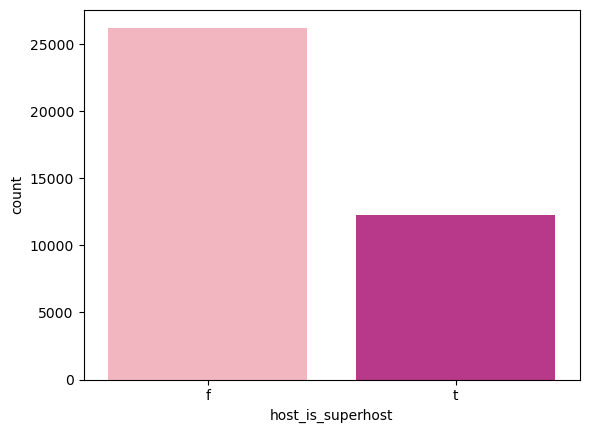

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.countplot(x='host_is_superhost', data=dataset, palette='RdPu', order = dataset['host_is_superhost'].value_counts().index)
plt.show()

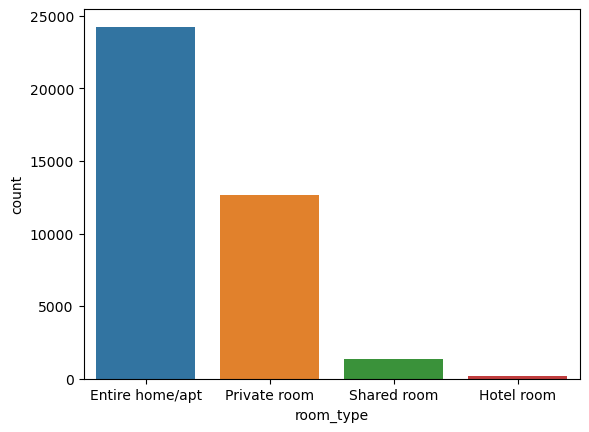

In [32]:
sns.countplot(x='room_type', data=dataset, order = dataset['room_type'].value_counts().index)
plt.show()

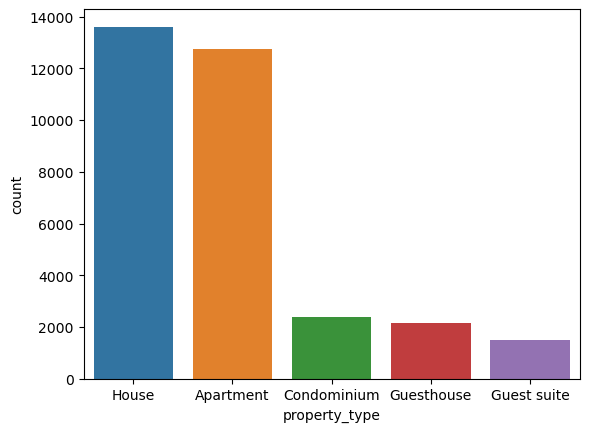

In [33]:
sns.countplot(x='property_type', data=dataset, order = dataset['property_type'].value_counts().iloc[:5].index)
plt.show()

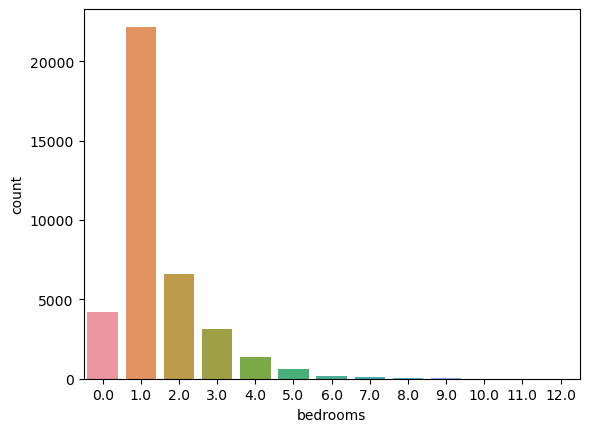

In [34]:
sns.countplot(x='bedrooms', data=dataset)
plt.show()

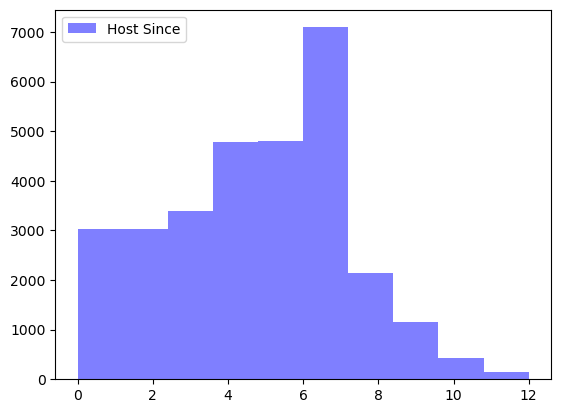

In [35]:
plt.hist(dataset2['host_since'],
        bins = 10,
        alpha = 0.5,
        color = 'blue',
        label = 'Host Since')
plt.legend(loc = 'upper left')

plt.show()

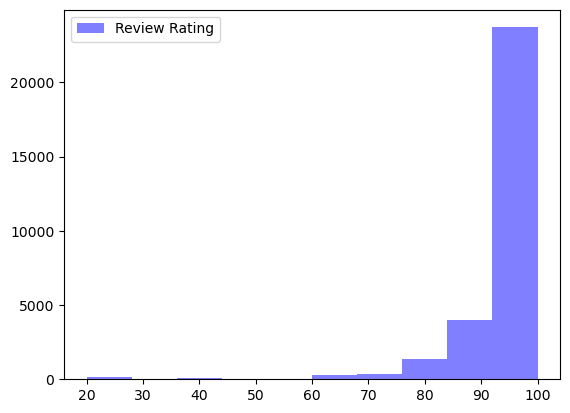

In [36]:
import matplotlib.pyplot as plt
plt.hist(dataset2['review_scores_rating'],
        bins = 10,
        alpha = 0.5,
        color = 'blue',
        label = 'Review Rating')
plt.legend(loc = 'upper left')

plt.show()

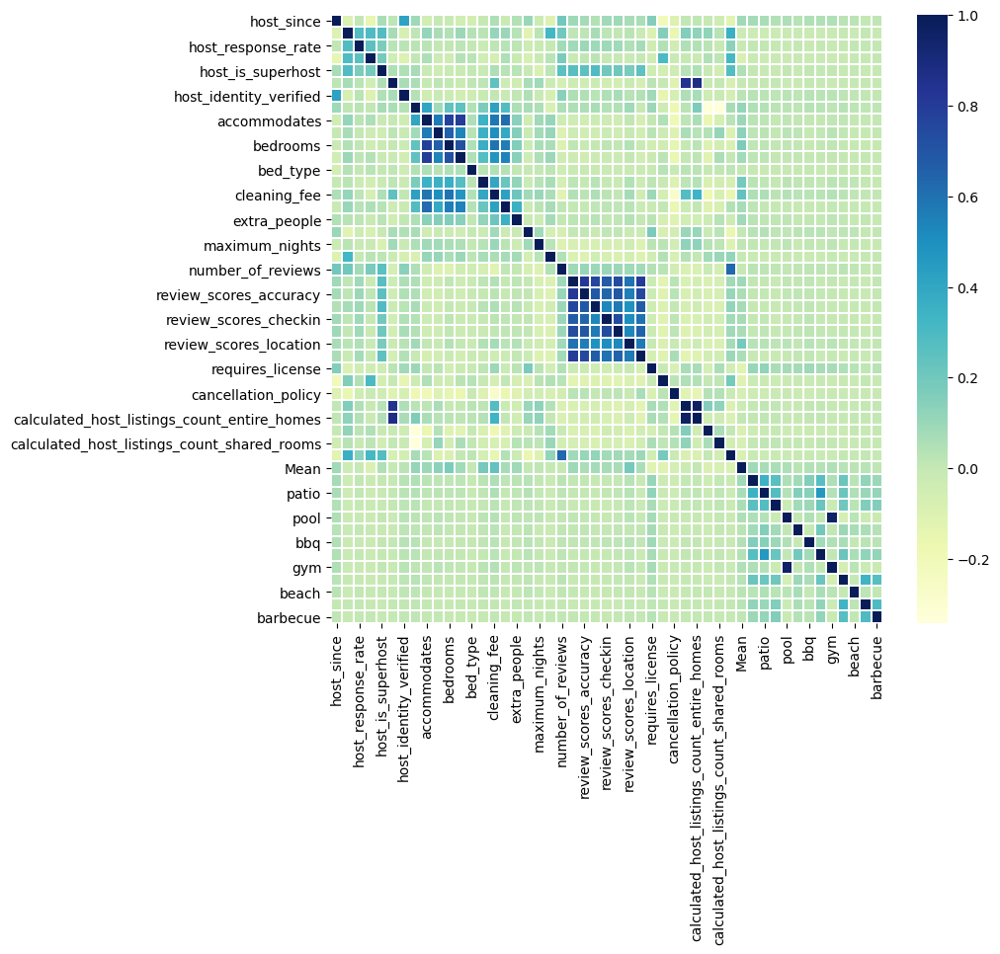

In [37]:
import matplotlib.pyplot as plt
corrmat = dataset2.corr() 
f, ax = plt.subplots(figsize =(9, 8)) 
sns.heatmap(corrmat, ax = ax, cmap ="YlGnBu", linewidths = 0.1)
plt.show()

# Cluster anlaysis 

In [38]:
cluster_data=dataset2.copy()
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
mms.fit(cluster_data[['host_since','beds','bathrooms','bedrooms','price','cleaning_fee','room_type','host_is_superhost']])
data_transformed = mms.transform(cluster_data[['host_since','beds','bathrooms','bedrooms','price','cleaning_fee','room_type','host_is_superhost']])

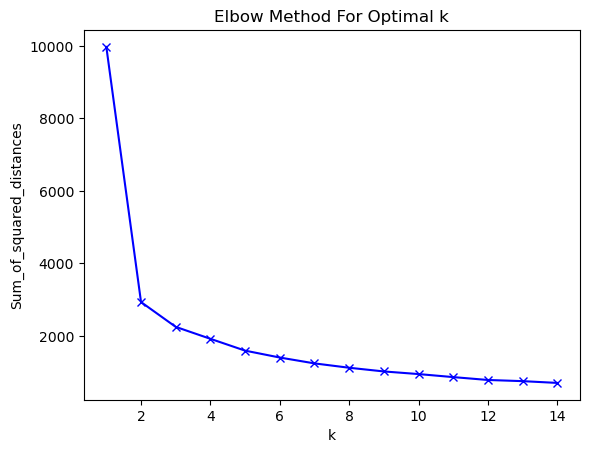

In [39]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [40]:
from sklearn.cluster import KMeans
cluster = KMeans(3, random_state=1)
cluster.fit(data_transformed)

KMeans(n_clusters=3, random_state=1)

In [41]:
cluster_data['clust_grp'] = cluster.predict(data_transformed)

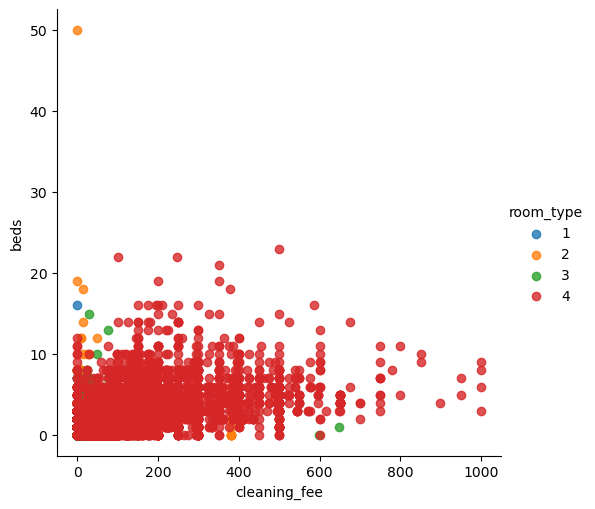

In [42]:
import seaborn as sns 
sns.lmplot(data = cluster_data, x = 'cleaning_fee', y = 'beds', hue = 'room_type', fit_reg = False)
plt.show()

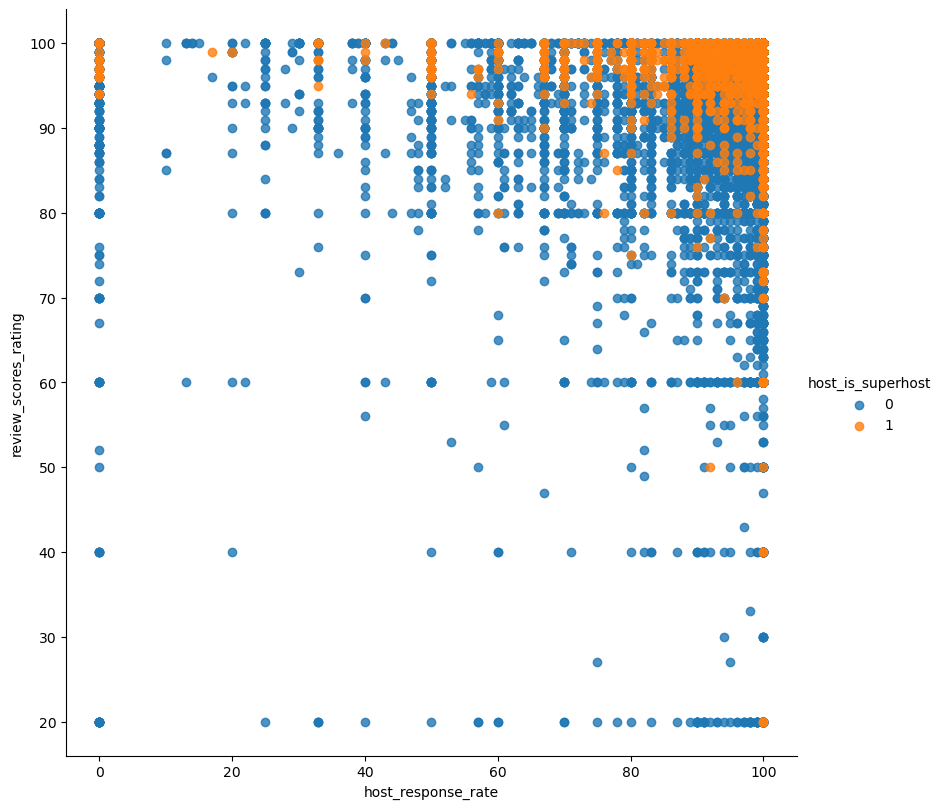

In [43]:
import seaborn as sns 
sns.lmplot(data = cluster_data, x = 'host_response_rate', y = 'review_scores_rating', hue = 'host_is_superhost',
           size=8, fit_reg = False)
plt.show()

## Superhost Classification

In [44]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dataset2.drop(columns=['host_is_superhost']), 
                                                    dataset2.host_is_superhost, 
                                                    test_size=0.2, 
                                                    random_state=1)

#### Logistic Regression

In [45]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.fit_transform(x_test)

In [46]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn import metrics
clf = LogisticRegressionCV(solver = 'sag',
                           penalty = 'l2',
                           Cs = 2,
                           n_jobs = -1,
                           random_state = 0,
                           class_weight = 'balanced'
)

In [47]:
clf_model = clf.fit(x_train, y_train)

In [48]:
x_train_probs = pd.DataFrame(clf_model.predict_proba(x_train))
x_test_probs = pd.DataFrame(clf_model.predict_proba(x_test))

In [49]:
#train AUC
fpr, tpr, thresholds = metrics.roc_curve(y_train, x_train_probs[1])
metrics.auc(fpr, tpr)

0.8444664351863677

In [50]:
#test AUC
fpr, tpr, thresholds = metrics.roc_curve(y_test, x_test_probs[1])
metrics.auc(fpr, tpr)

0.8392627546277506

### XGBoost

In [51]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dataset2.drop(columns=['host_is_superhost']), 
                                                    dataset2.host_is_superhost, 
                                                    test_size=0.2, 
                                                    random_state=1)

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state=1)

In [52]:
import xgboost as xgb
dtrain = xgb.DMatrix(data = x_train, label = y_train)
dval = xgb.DMatrix(data = x_val, label = y_val)
dtest = xgb.DMatrix(data = x_test, label = y_test)

In [53]:
param = {'max_depth':3,
         'eta': 0.35,
         'silent':1,
         'objective':'binary:logistic',
         'eval_metric': 'logloss'
         ,'maximize' : 'FALSE'
         ,'n_jobs' : -1
        }

In [54]:
watchlist = [(dtrain, 'train'), (dval, 'eval')]
num_round = 100
bst = xgb.train(param, dtrain, num_round, watchlist, early_stopping_rounds = 10, verbose_eval = False)

[20:00:05] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "maximize", "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [55]:
LOS_train_w_preds = x_train
LOS_train_w_preds['xgb_probs'] = bst.predict(dtrain)

LOS_test_w_preds = x_test
LOS_test_w_preds['xgb_probs'] = bst.predict(dtest)

In [56]:
y = y_test
scores = LOS_test_w_preds['xgb_probs']

In [57]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y, scores)
metrics.auc(fpr, tpr)

0.9199187705070427

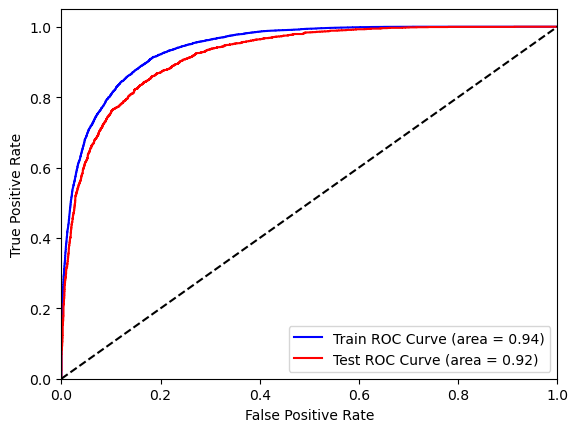

In [58]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

plt.plot(roc_curve(y_train, LOS_train_w_preds['xgb_probs'])[0],roc_curve(y_train, LOS_train_w_preds['xgb_probs'])[1], 
         color = 'blue', label='Train ROC Curve (area = %0.2f)' % roc_auc_score(y_train, LOS_train_w_preds['xgb_probs']))

plt.plot(roc_curve(y_test, LOS_test_w_preds['xgb_probs'])[0],roc_curve(y_test, LOS_test_w_preds['xgb_probs'])[1], 
         color = 'red', label='Test ROC Curve (area = %0.2f)' % roc_auc_score(y_test, LOS_test_w_preds['xgb_probs']))


plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

In [59]:
param_auc = {'max_depth':3,
         'eta': 0.35,
         'silent':1,
         'objective':'binary:logistic',
         'eval_metric': 'auc'
         ,'maximize' : 'TRUE'
         ,'n_jobs' : -1
        }

In [60]:
watchlist = [(dtrain, 'train'), (dval, 'eval')]
num_round = 100
bst_auc = xgb.train(param_auc, dtrain, num_round, watchlist, early_stopping_rounds = 10, verbose_eval = False)

[20:00:07] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "maximize", "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [61]:
LOS_train_w_preds['xgb_probs_auc'] = bst_auc.predict(dtrain)
LOS_test_w_preds['xgb_probs_auc'] = bst_auc.predict(dtest)

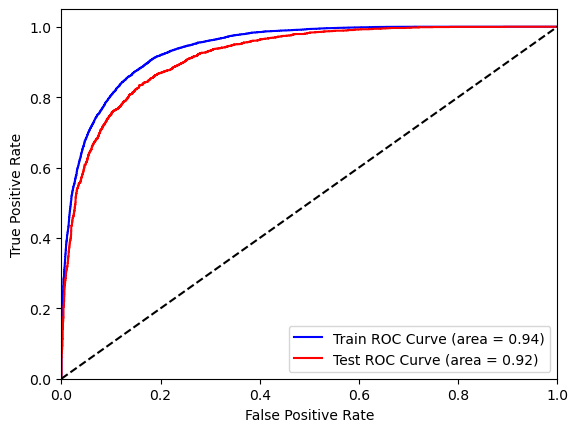

In [62]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

plt.plot(roc_curve(y_train, LOS_train_w_preds['xgb_probs_auc'])[0],roc_curve(y_train, LOS_train_w_preds['xgb_probs_auc'])[1], 
         color = 'blue', label='Train ROC Curve (area = %0.2f)' % roc_auc_score(y_train, LOS_train_w_preds['xgb_probs_auc']))

plt.plot(roc_curve(y_test, LOS_test_w_preds['xgb_probs_auc'])[0],roc_curve(y_test, LOS_test_w_preds['xgb_probs_auc'])[1], 
         color = 'red', label='Test ROC Curve (area = %0.2f)' % roc_auc_score(y_test, LOS_test_w_preds['xgb_probs_auc']))


plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

#### Tuning with HyperOpt

In [63]:
import hyperopt as hp
from hyperopt import Trials,fmin,STATUS_OK

In [64]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dataset2.drop(columns=['host_is_superhost']), 
                                                    dataset2.host_is_superhost, 
                                                    test_size=0.2, 
                                                    random_state=1)

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state=1)

In [65]:
import xgboost as xgb
dtrain = xgb.DMatrix(data = x_train, label = y_train)
dval = xgb.DMatrix(data = x_val, label = y_val)
dtest = xgb.DMatrix(data = x_test, label = y_test)

In [66]:
# Sets the space to search over and the prior probabilities over the search space 
xgb_space = {
    'booster': 'gbtree',
    'objective':'binary:logistic',
    'eval_metric' : 'auc',
    'eta': hp.hp.quniform('eta', 0.025, 0.2, 0.025),
    'max_depth':hp.hp.choice('max_depth', np.arange(1, 14, dtype=int)),
    'subsample':hp.hp.quniform('subsample',0.5,1.0,0.05),
    'colsample_bytree':hp.hp.quniform('colsample_bytree',0.5,1.0,0.05),
    'min_child_weight':hp.hp.quniform('min_child_weight', 100, 1000,100),
    'lambda': hp.hp.uniform('reg_alpha', 0.0, 1000.0),
    'alpha': hp.hp.uniform('reg_lambda', 0.0, 1000.0),
    'scale_pos_weight': hp.hp.uniform('scale_pos_weight', 6.0, 10.0)
    }

In [67]:
def objective_m(params, n_folds=5):
    model = xgb.cv(params = params,
              dtrain = dtrain,
              num_boost_round = 100,
              early_stopping_rounds = 10,
             nfold = n_folds)
    # returns the best average loss on validation set 
    loss = 1 - max(model['test-auc-mean'])
    return loss

In [68]:
xgb_best_m = fmin(fn = objective_m, space = xgb_space, algo = hp.tpe.suggest, max_evals = 100, trials = Trials())

100%|██████████████████████████████████████████████| 100/100 [08:50<00:00,  5.31s/trial, best loss: 0.0890550000000001]


In [69]:
xgb_best_m

{'colsample_bytree': 1.0,
 'eta': 0.2,
 'max_depth': 9,
 'min_child_weight': 100.0,
 'reg_alpha': 527.885012123716,
 'reg_lambda': 0.8752509347171298,
 'scale_pos_weight': 8.377346096476531,
 'subsample': 0.8500000000000001}

In [70]:
#parameters based on HyperOpt used for final presentation (powerpoint)
param = {'booster': 'gbtree',
    'objective':'binary:logistic',
    'eval_metric' : 'auc',
         'maximize' : 'FALSE',
         'n_thread': 4,
    'colsample_bytree': 0.8,
 'eta': 0.17500000000000002,
 'max_depth': 6,
 'min_child_weight': 100.0,
 'reg_alpha': 39.693312320205564,
 'reg_lambda': 65.31328845620804,
 'scale_pos_weight': 6.251456630674799,
 'subsample': 0.9500000000000001}

In [71]:
watchlist = [(dtrain, 'train'), (dval, 'eval')]
num_round = 100
bst_hyp = xgb.train(param, dtrain, num_round, watchlist, early_stopping_rounds = 10, verbose_eval = False)

[20:09:02] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "maximize", "n_thread" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [72]:
#train AUC
fpr, tpr, thresholds = metrics.roc_curve(y_train, bst_hyp.predict(dtrain))
metrics.auc(fpr, tpr)

0.9306617221588518

In [73]:
#test AUC
fpr, tpr, thresholds = metrics.roc_curve(y_test, bst_hyp.predict(dtest))
metrics.auc(fpr, tpr)

0.9129771744696289

#### Confusion Matrices and Statistics

In [74]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report

In [75]:
LOS_test_w_preds['responses'] =  LOS_test_w_preds['xgb_probs'].map(lambda x: 1 if x > .3 else 0)

In [76]:
#confusion matrix for p>.3
pd.crosstab(y_test, LOS_test_w_preds['responses'],
            rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
True,,,
0,2946,835,3781
1,257,1965,2222
All,3203,2800,6003


In [77]:
results = confusion_matrix(y_test, LOS_test_w_preds['responses'])
#Accuracy
accuracy_score(y_test, LOS_test_w_preds['responses'])

0.8180909545227386

In [78]:
#Statistics
print(classification_report(y_test, LOS_test_w_preds['responses']))

              precision    recall  f1-score   support

           0       0.92      0.78      0.84      3781
           1       0.70      0.88      0.78      2222

    accuracy                           0.82      6003
   macro avg       0.81      0.83      0.81      6003
weighted avg       0.84      0.82      0.82      6003



### LightGBM

In [79]:
import lightgbm as lgb
from hyperband import HyperbandSearchCV

In [80]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dataset2.drop(columns=['host_is_superhost']), 
                                                    dataset2.host_is_superhost, 
                                                    test_size=0.2, 
                                                    random_state=1)

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state=1)

In [81]:
model=lgb.LGBMClassifier(boosting_type='gbdt', 
                                    num_leaves=31, 
                                    max_depth=-1, 
                                    learning_rate=0.01, 
                                    n_estimators=1000, 
                                    max_bin=255, 
                                    subsample_for_bin=50000, 
                                    objective='binary', 
                                    min_split_gain=0, 
                                    min_child_weight=3,
                                    min_child_samples=10, 
                                    subsample=1, 
                                    subsample_freq=1, 
                                    colsample_bytree=1, 
                                    reg_alpha=0.1, 
                                    reg_lambda=0, 
                                    seed=17,
                                    silent=False, 
                                    nthread=-1)
lgb_params = {
'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.4, 0.5],
                        'estimator_max_depth' : [3, 5, 20],
                        'num_leaves': [6,8,12,16, 50],
                    'random_state' : [501]
}

In [82]:
lgb_hyper=HyperbandSearchCV(model,lgb_params, cv=3,verbose = 1,
                           max_iter=200, min_iter=50,
                           scoring='f1_macro', n_jobs = -1)

In [83]:
lgb_hyper.fit(x_train,y_train)

Starting bracket 1 (out of 2) of hyperband
Starting successive halving iteration 1 out of 2. Fitting 3 configurations, with resource_param n_estimators set to 66, and keeping the best 1 configurations.
Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:    7.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Starting successive halving iteration 2 out of 2. Fitting 1 configurations, with resource_param n_estimators set to 200
Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Starting bracket 2 (out of 2) of hyperband
Starting successive halving iteration 1 out of 1. Fitting 2 configurations, with resource_param n_estimators set to 200
Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    1.7s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    1.7s finished


[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=-1 will be ignored. Current value: num_threads=-1
[LightGBM] [Warning] Unknown parameter: estimator_max_depth
[LightGBM] [Warning] seed is set=17, random_state=501 will be ignored. Current value: seed=17
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=-1 will be ignored. Current value: num_threads=-1
[LightGBM] [Warning] Unknown parameter: estimator_max_depth
[LightGBM] [Warning] seed is set=17, random_state=501 will be ignored. Current value: seed=17
[LightGBM] [Info] Number of positive: 7248, number of negative: 11960
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2067
[LightGBM] [Info] Number of data points in the train set: 19208, number of used features: 48
[LightGBM] [Info] [binary:BoostFromSco

HyperbandSearchCV(cv=3,
                  estimator=LGBMClassifier(colsample_bytree=1,
                                           learning_rate=0.01, max_bin=255,
                                           min_child_samples=10,
                                           min_child_weight=3, min_split_gain=0,
                                           n_estimators=1000, nthread=-1,
                                           objective='binary', reg_alpha=0.1,
                                           reg_lambda=0, seed=17, silent=False,
                                           subsample=1, subsample_for_bin=50000,
                                           subsample_freq=1),
                  max_iter=200, min_iter=50, n_jobs=-1,
                  param_distributions={'estimator_max_depth': [3, 5, 20],
                                       'learning_rate': [0.01, 0.1, 0.2, 0.3,
                                                         0.4, 0.5],
                                       '

In [84]:
lgb_hyper.best_params_

{'random_state': 501,
 'num_leaves': 16,
 'learning_rate': 0.3,
 'estimator_max_depth': 20,
 'n_estimators': 200}

In [85]:
lgb_params={'random_state': 501,
 'num_leaves': 50,
 'learning_rate': 0.2,
 'estimator_max_depth': 5,
 'n_estimators': 200}

In [86]:
x_train_dataset=lgb.Dataset(x_train,y_train)
x_val_dataset=lgb.Dataset(x_val,y_val)

In [87]:
lgb_model = lgb.train(params = lgb_params, train_set = x_train_dataset,
                num_boost_round = 100,valid_sets=[x_train_dataset,x_val_dataset],
                     valid_names = ['Validation', 'Train'])

[LightGBM] [Warning] Unknown parameter: estimator_max_depth
[LightGBM] [Warning] Unknown parameter: estimator_max_depth
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2067
[LightGBM] [Info] Number of data points in the train set: 19208, number of used features: 48
[LightGBM] [Warning] Unknown parameter: estimator_max_depth
[LightGBM] [Info] Start training from score 0.377343


In [88]:
y_probs_train = lgb_model.predict(x_train)
y_probs_test=lgb_model.predict(x_test)

In [89]:
fpr, tpr, thresholds = metrics.roc_curve(y_train, y_probs_train)
metrics.auc(fpr, tpr)

0.9978701194009465

In [90]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_probs_test)
metrics.auc(fpr, tpr)

0.9305707084858184

In [91]:
import hyperopt as hp
from hyperopt import Trials,fmin,STATUS_OK

In [92]:
#parameters based on HyperBand used for final presentation (powerpoint)
lgb_params = {'bagging_fraction': 0.2539785449890212,
 'bagging_frequency': 18,
 'colsample_bytree': 0.9,
 'boosting_type': 'gbdt',
 'drop_rate': 0.03984315262607092,
 'feature_fraction': 0.4754454065255638,
 'learning_rate': 0.08990752734049504,
 'min_child_weight': 100.0,
 'num_leaves': 282,
 'reg_alpha': 0.7411074663457006,
 'reg_lambda': 927.2278613123793,
 'scale_pos_weight': 7.163066476768787,
 'subsample': 0.5}

In [93]:
lgb_gbm = lgb.train(params = lgb_params, train_set = x_train_dataset,
                num_boost_round = 100,valid_sets=[x_train_dataset,x_val_dataset],
                     valid_names = ['Validation', 'Train'])

[LightGBM] [Warning] Unknown parameter: estimator_max_depth
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] feature_fraction is set=0.4754454065255638, colsample_bytree=0.9 will be ignored. Current value: feature_fraction=0.4754454065255638
[LightGBM] [Warning] bagging_fraction is set=0.2539785449890212, subsample=0.5 will be ignored. Current value: bagging_fraction=0.2539785449890212
[LightGBM] [Warning] Unknown parameter: estimator_max_depth
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] feature_fraction is set=0.4754454065255638, colsample_bytree=0.9 will be ignored. Current value: feature_fraction=0.4754454065255638
[LightGBM] [Warning] bagging_fraction is set=0.2539785449890212, subsample=0.5 will be ignored. Current value: bagging_fraction=0.2539785449890212
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] feature_fraction is set=0.4754454065255638, colsample_bytree=0.9 will be ignored. C

In [94]:
y_probs_train = lgb_gbm.predict(x_train)
y_probs_test = lgb_gbm.predict(x_test)

In [95]:
fpr, tpr, thresholds = metrics.roc_curve(y_train, y_probs_train)
metrics.auc(fpr, tpr)

0.9217122864478358

In [96]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_probs_test)
metrics.auc(fpr, tpr)

0.9049546848363758

## Shap Explainer

In [97]:
import shap

In [98]:
xgb_shap_explainer = shap.TreeExplainer(bst)

In [99]:
xgb_shap_vals_train = xgb_shap_explainer.shap_values(dtrain)
xgb_shap_vals_test = xgb_shap_explainer.shap_values(dtest)

In [100]:
shap.initjs()
shap.force_plot(xgb_shap_explainer.expected_value, xgb_shap_vals_train[0,:], x_train.iloc[0,:])

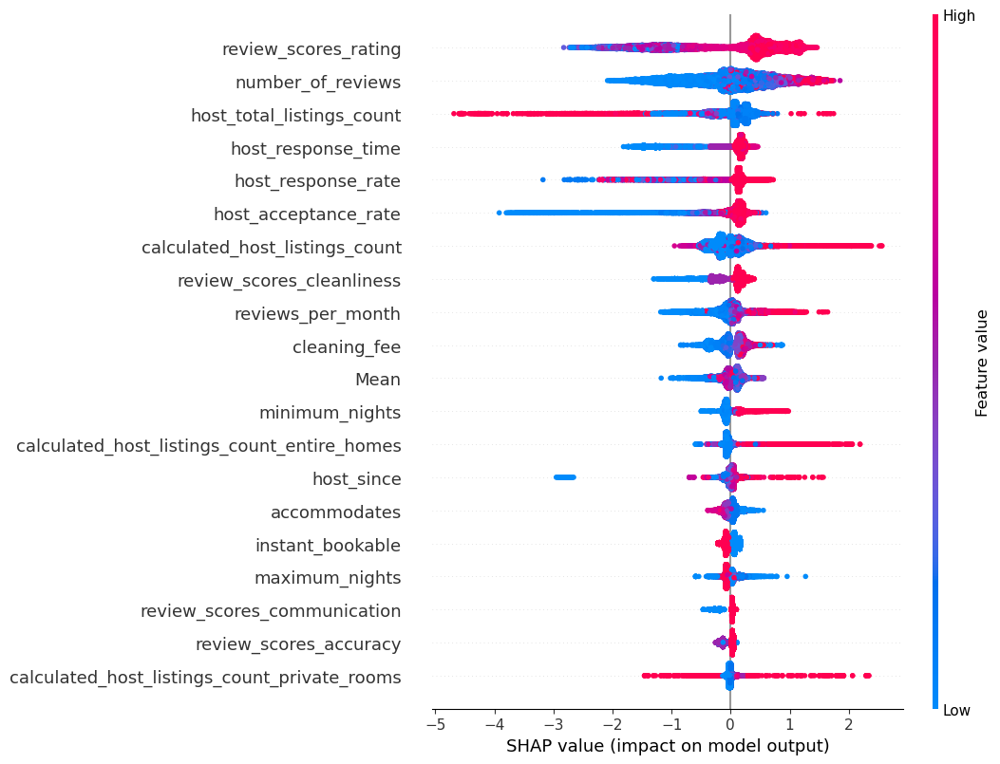

In [101]:
shap.summary_plot(xgb_shap_vals_train, x_train)

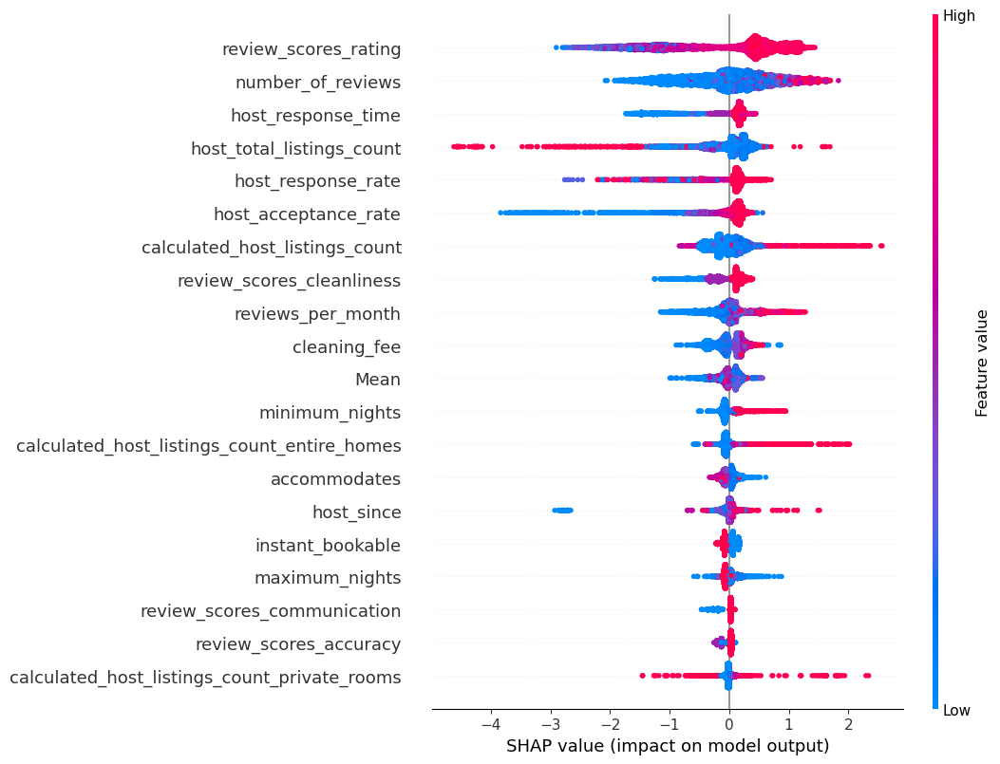

In [102]:
shap.summary_plot(xgb_shap_vals_test, x_test)

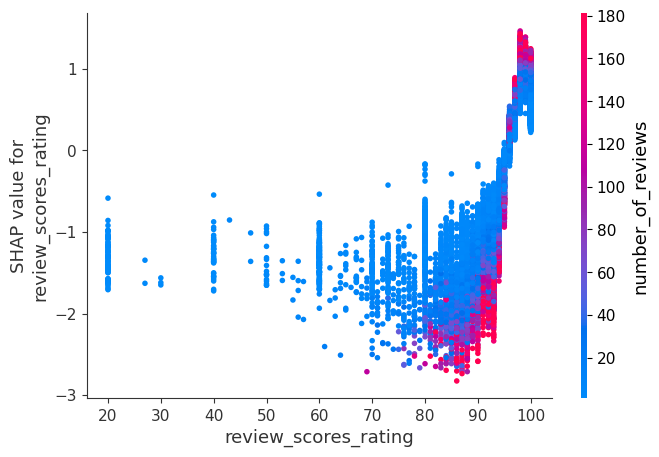

In [103]:
shap.dependence_plot("rank(0)", xgb_shap_vals_train, x_train)

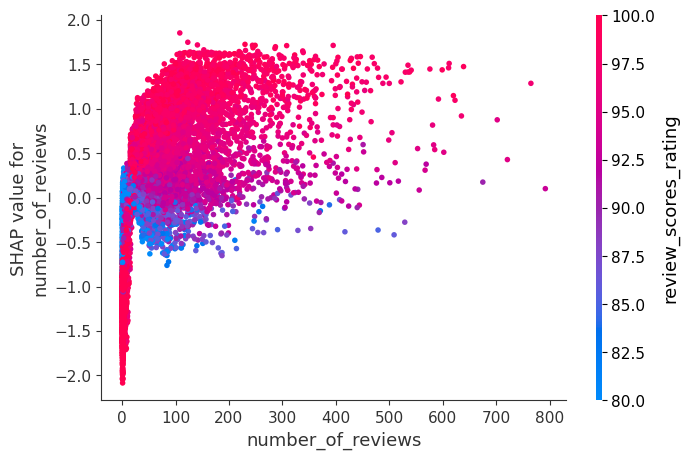

In [104]:
shap.dependence_plot("rank(1)", xgb_shap_vals_train, x_train)

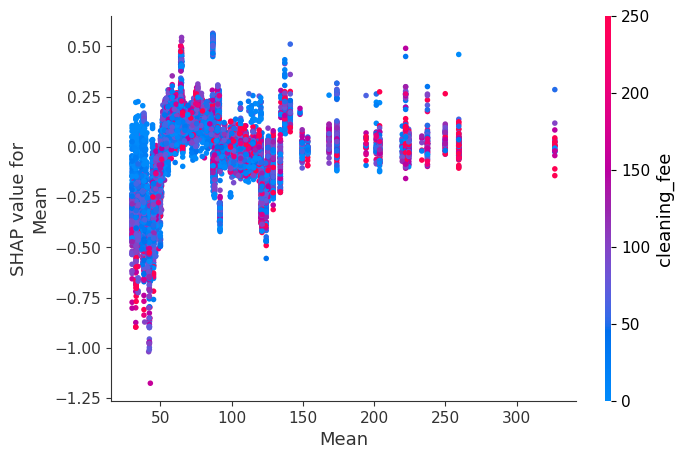

In [105]:
shap.dependence_plot("Mean", xgb_shap_vals_train, x_train)

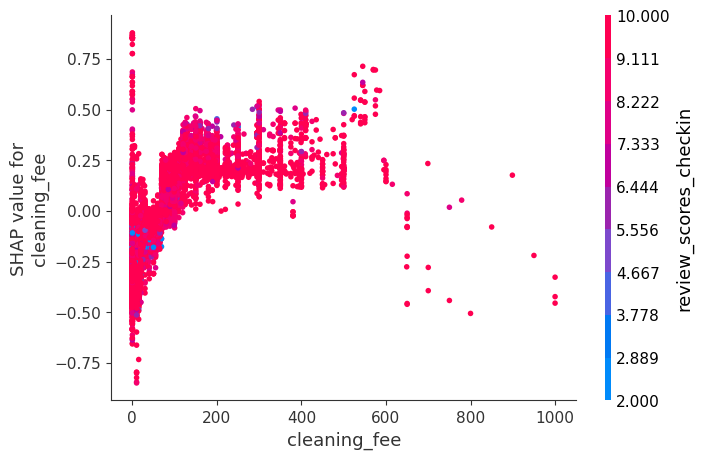

In [106]:
shap.dependence_plot("cleaning_fee", xgb_shap_vals_train, x_train)

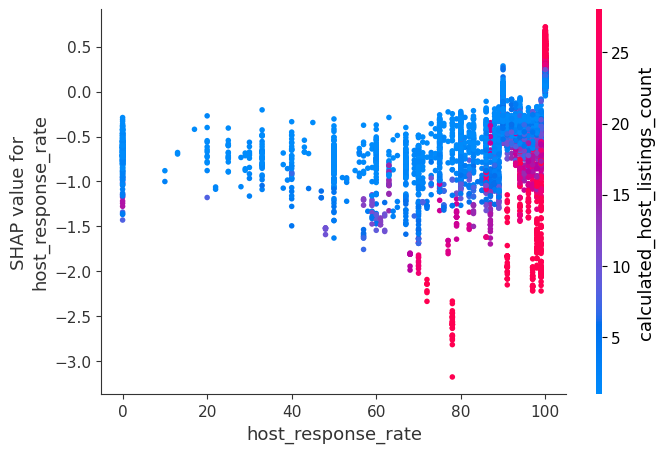

In [107]:
shap.dependence_plot("rank(4)", xgb_shap_vals_train, x_train)

## Price Regression

In [108]:
dataset3 = dataset2.copy()

In [109]:
from numpy import log
q_low = dataset3["price"].quantile(0.01)
q_hi  = dataset3["price"].quantile(0.99)
dataset3 = dataset3[(dataset3["price"] < q_hi) & (dataset3["price"] > q_low)]
dataset3['price'] = log(dataset3['price'])

#### Linear Regression

In [110]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(dataset3.drop(columns = ['price']), 
                                                    dataset3['price'], 
                                                    test_size=0.2, 
                                                    random_state=1)

In [111]:
from numpy import log
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.fit_transform(x_test)

In [112]:
from scipy import stats
from sklearn.linear_model import LinearRegression
X = x_train
y = y_train
lm = LinearRegression()
lm.fit(X,y)
params = np.append(lm.intercept_,lm.coef_)
predictions = lm.predict(X)

newX = pd.DataFrame({"Constant":np.ones(len(X))}).join(pd.DataFrame(X))
MSE = (sum((y-predictions)**2))/(len(newX)-len(newX.columns))

var_b = MSE*(np.linalg.inv(np.dot(newX.T,newX)).diagonal())
sd_b = np.sqrt(var_b)
ts_b = params/ sd_b

p_values =[2*(1-stats.t.cdf(np.abs(i),(len(newX)-1))) for i in ts_b]

sd_b = np.round(sd_b,3)
ts_b = np.round(ts_b,3)
p_values = np.round(p_values,3)
params = np.round(params,4)
tempdata = dataset3.copy()
tempdata.insert(0,'intercept',0)
tempdata.drop(['price'],axis = 1, inplace = True)
myDF3 = pd.DataFrame()
myDF3['Variable'],myDF3["Coeff"],myDF3["SE"],myDF3["t value"],myDF3["Prob"] = [tempdata.columns,params,sd_b,ts_b,p_values]
myDF3

,Variable,Coeff,SE,t value,Prob
0,intercept,4.7305,0.003,1828.915,0.000
1,host_since,0.0221,0.003,7.119,0.000
2,host_response_time,-0.0243,0.003,-7.356,0.000
3,host_response_rate,-0.0070,0.003,-2.513,0.012
4,host_acceptance_rate,-0.0006,0.003,-0.207,0.836
5,host_is_superhost,0.0064,0.003,2.140,0.032
6,host_total_listings_count,0.0301,0.006,5.420,0.000
7,host_identity_verified,0.0034,0.003,1.160,0.246
8,room_type,0.2351,0.004,65.295,0.000
9,accommodates,0.1589,0.006,28.661,0.000


In [113]:
regressor = LinearRegression()  
regressor.fit(x_train, y_train)

LinearRegression()

In [114]:
np.set_printoptions(formatter={'float': lambda x: "{0:0.5f}".format(x)})
print(regressor.coef_)

[0.02214 -0.02428 -0.00698 -0.00062 0.00637 0.03005 0.00336 0.23507
 0.15890 0.03315 0.13008 -0.02945 0.01040 0.14140 0.00856 0.02514 -0.03445
 0.00727 0.06545 -0.00287 0.05271 -0.01879 0.04445 -0.03498 -0.01110
 0.04499 -0.05552 0.05983 0.00991 -0.00267 0.65823 -0.68156 -0.14714
 -0.10284 -0.03152 0.10518 0.00968 0.00776 0.00063 0.01122 0.00419
 -0.00174 -0.00440 -0.00234 0.00366 -0.00021 -0.00468 0.00153]


In [115]:
#Train R2
from sklearn.metrics import r2_score
r2_score(y_train.values, regressor.predict(x_train))

0.6840335262604247

In [116]:
#Test R2
r2_score(y_test.values, regressor.predict(x_test))

0.6776269957603827

In [117]:
y_pred = regressor.predict(x_test)
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df1 = df.head(25)
df1
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.2995543511651181
Mean Squared Error: 0.16396640436709903
Root Mean Squared Error: 0.40492765325067515


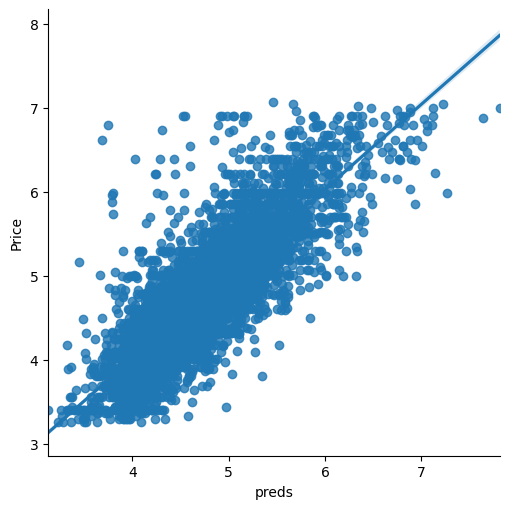

In [118]:
#Plot of data
y_test_plot = pd.DataFrame({'Price':y_test, 'preds':regressor.predict(x_test)})
y_test_plot['residuals'] = y_test_plot['Price'] - y_test_plot['preds']
sns.lmplot(x='preds',y='Price', data = y_test_plot, fit_reg = True)
plt.show()

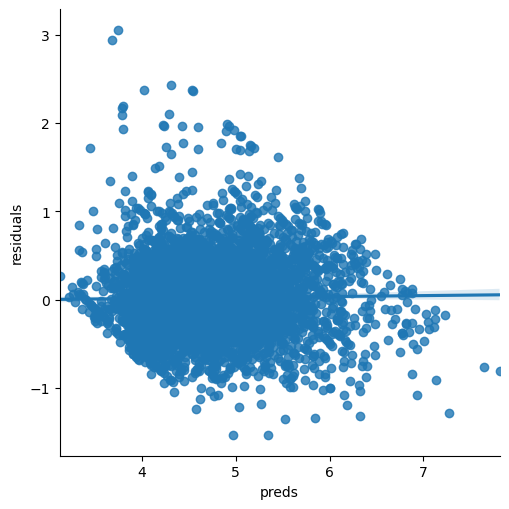

In [119]:
#Plot of Residuals
sns.lmplot(data = y_test_plot, x = 'preds', y = 'residuals', fit_reg = True)
plt.show()

#### Linear Regression (ElasticNet)

In [120]:
from sklearn.linear_model import ElasticNetCV
model_cv = ElasticNetCV(l1_ratio = [.1, .5, .7, .9, .95, .99, 1], cv=5)
model_cv = model_cv.fit(x_train, y_train)
model_cv.l1_ratio_

1.0

In [121]:
#Train R2
from sklearn.metrics import r2_score
r2_score(y_train.values, model_cv.predict(x_train))

0.6836193469631122

In [122]:
#Test R2
r2_score(y_test.values, model_cv.predict(x_test))

0.6774458419267106

In [123]:
y_pred = regressor.predict(x_test)
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df1 = df.head(25)
df1
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.2995543511651181
Mean Squared Error: 0.16396640436709903
Root Mean Squared Error: 0.40492765325067515


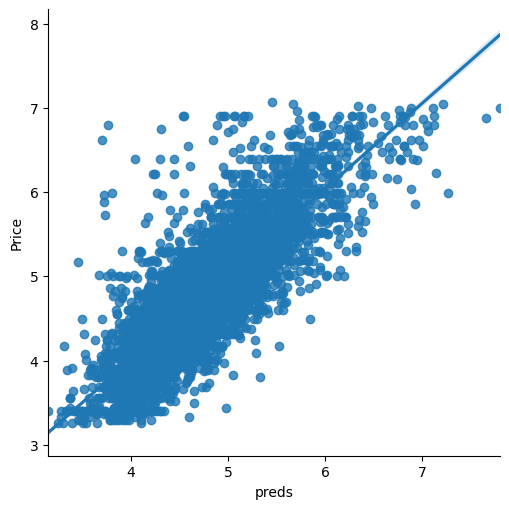

In [124]:
#Plot of data
y_test_plot = pd.DataFrame({'Price':y_test, 'preds':model_cv.predict(x_test)})
y_test_plot['residuals'] = y_test_plot['Price'] - y_test_plot['preds']
sns.lmplot(x='preds',y='Price', data = y_test_plot, fit_reg = True)
plt.show()

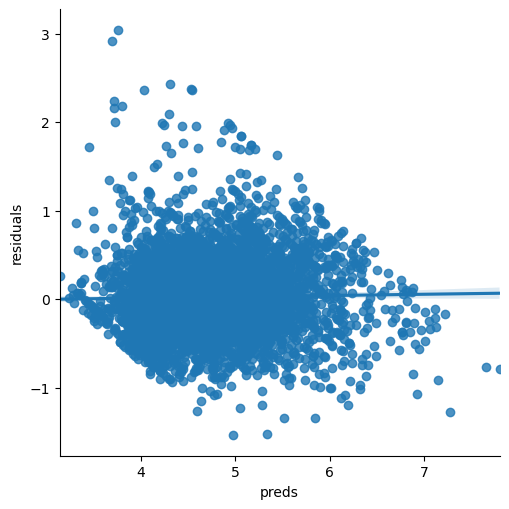

In [125]:
#Plot of Residuals
sns.lmplot(data = y_test_plot, x = 'preds', y = 'residuals', fit_reg = True)
plt.show()

#### XGBoost

In [126]:
x_trainr, x_testr, y_trainr, y_testr = train_test_split(dataset3.drop(columns = ['price']), 
                                                    dataset3['price'], 
                                                    test_size=0.2, 
                                                    random_state=1)

x_trainr, x_valr, y_trainr, y_valr = train_test_split(x_trainr, y_trainr, test_size = 0.2, random_state = 1)

In [127]:
import xgboost as xgb
dtrainr = xgb.DMatrix(data = x_trainr, label = y_trainr)
dvalr = xgb.DMatrix(data = x_valr, label = y_valr)
dtestr = xgb.DMatrix(data = x_testr, label = y_testr)

In [128]:
param_r = {'booster' : 'gblinear'
           ,'feature_selector' : 'cyclic'
           , 'objective' : 'reg:squarederror'
           , 'eval_metric' : 'rmse'
           , 'maximize' : 'FALSE'
        }

In [129]:
watchlist = [(dtrainr, 'train'), (dvalr, 'eval')]
num_round = 1000
xgb_r = xgb.train(param_r, dtrainr, num_round, watchlist, early_stopping_rounds = 10,verbose_eval = False)

[20:10:24] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "maximize" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [130]:
#Train R2
from sklearn.metrics import r2_score
r2_score(y_trainr.values, xgb_r.predict(dtrainr))

0.6800187378418593

In [131]:
#Test R2
from sklearn.metrics import r2_score
r2_score(y_testr.values, xgb_r.predict(dtestr))

0.6740823411502375

In [132]:
y_pred = xgb_r.predict(dtestr)
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df1 = df.head(25)
df1
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 0.30262855316003573
Mean Squared Error: 0.16576929810666527
Root Mean Squared Error: 0.407147759550099


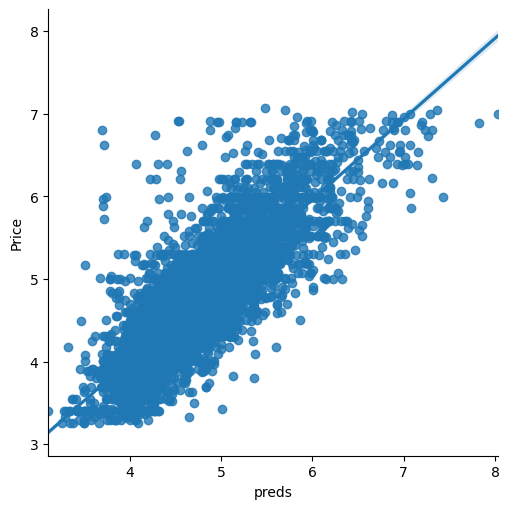

In [133]:
#Plot of data
y_test_plot = pd.DataFrame({'Price':y_test, 'preds':xgb_r.predict(dtestr)})
y_test_plot['residuals'] = y_test_plot['Price'] - y_test_plot['preds']
sns.lmplot(x='preds',y='Price', data = y_test_plot, fit_reg = True)
plt.show()

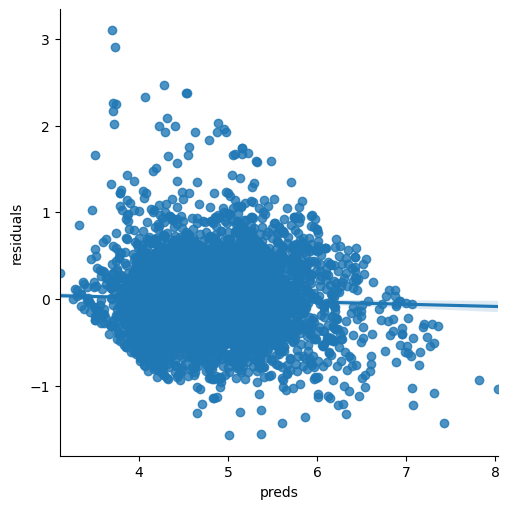

In [134]:
#Plot of Residuals
sns.lmplot(data = y_test_plot, x = 'preds', y = 'residuals', fit_reg = True)
plt.show()

### Predict a Host's Rating
#### What are most important factors for 90+ rating?

In [135]:
datasetH = dataset2.drop(columns=['host_is_superhost','number_of_reviews', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month'],axis = 1)

In [136]:
datasetH['host95'] = np.where(dataset2['review_scores_rating'] >=90,1, 0)

In [137]:
datasetH.drop(['review_scores_rating'], axis = 1, inplace = True)

In [138]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(datasetH.drop(columns=['host95']), 
                                                    datasetH.host95, 
                                                    test_size=0.2, 
                                                    random_state=1)

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state=1)

In [139]:
import xgboost as xgb
dtrain = xgb.DMatrix(data = x_train, label = y_train)
dval = xgb.DMatrix(data = x_val, label = y_val)
dtest = xgb.DMatrix(data = x_test, label = y_test)

In [140]:
param_auc = {'max_depth':3,
         'eta': 0.1,
         'silent':1,
         'objective':'binary:logistic',
         'eval_metric': 'auc'
         ,'maximize' : 'TRUE'
         ,'n_jobs' : -1
        }

In [141]:
watchlist = [(dtrain, 'train'), (dval, 'eval')]
num_round = 100
bst_auc = xgb.train(param_auc, dtrain, num_round, watchlist, early_stopping_rounds = 10, verbose_eval = False)

[20:10:31] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "maximize", "silent" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




In [142]:
LOS_train_w_preds['xgb_probs_auc'] = bst_auc.predict(dtrain)
LOS_test_w_preds['xgb_probs_auc'] = bst_auc.predict(dtest)

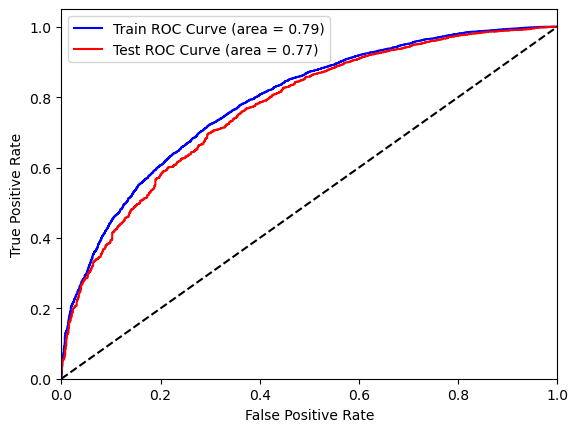

In [143]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score

plt.plot(roc_curve(y_train, LOS_train_w_preds['xgb_probs_auc'])[0],roc_curve(y_train, LOS_train_w_preds['xgb_probs_auc'])[1], 
         color = 'blue', label='Train ROC Curve (area = %0.2f)' % roc_auc_score(y_train, LOS_train_w_preds['xgb_probs_auc']))

plt.plot(roc_curve(y_test, LOS_test_w_preds['xgb_probs_auc'])[0],roc_curve(y_test, LOS_test_w_preds['xgb_probs_auc'])[1], 
         color = 'red', label='Test ROC Curve (area = %0.2f)' % roc_auc_score(y_test, LOS_test_w_preds['xgb_probs_auc']))


plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

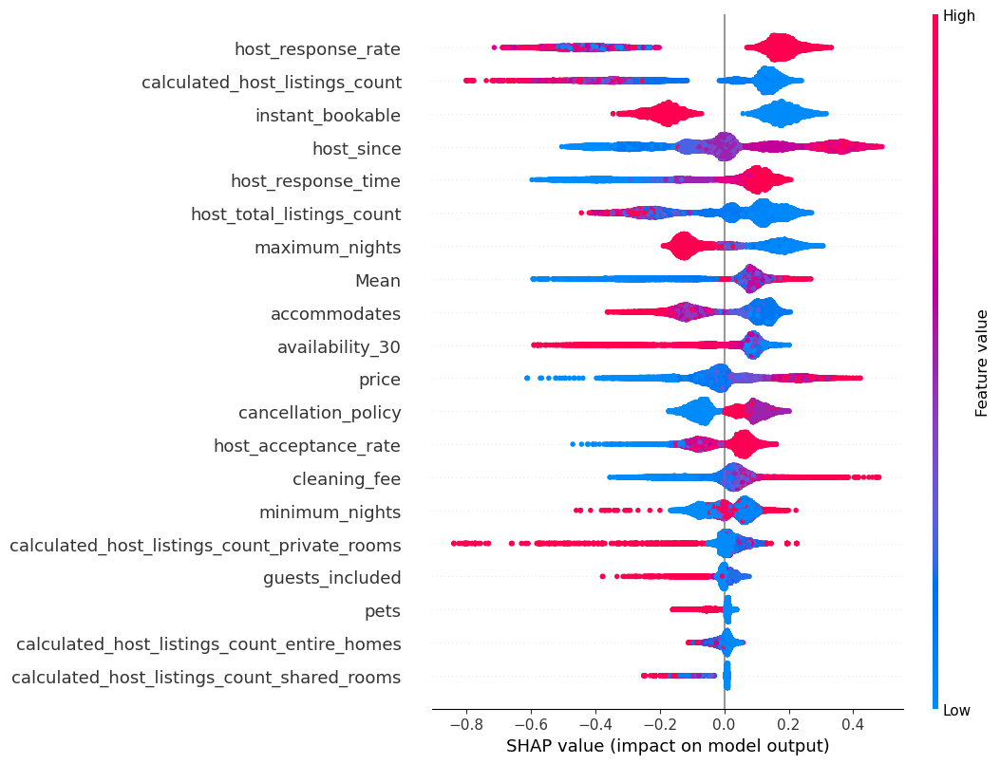

In [144]:
xgb_shap_explainer = shap.TreeExplainer(bst_auc)
xgb_shap_vals_train = xgb_shap_explainer.shap_values(dtrain)
shap.summary_plot(xgb_shap_vals_train, x_train)

## Price Histogram

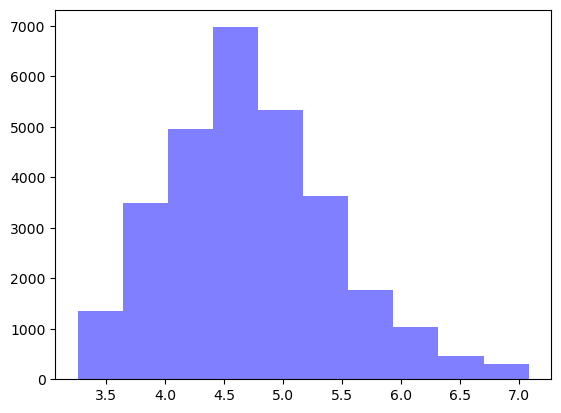

In [145]:
plt.hist(dataset3['price'],
        bins = 10,
        alpha = 0.5,
        color = 'blue',
        label = 'LogPrice')
plt.show()

### Geographical Representation

In [146]:
import plotly.express as px
geo = dataset[['latitude', 'longitude', 'price']]

In [147]:
from numpy import log
geo['price'] = geo['price'].str.replace(',','')
geo['price'] = geo['price'].str.replace('$','')
geo['price'] = geo['price'].astype('float')/1.0
q_low = geo["price"].quantile(0.02)
q_hi  = geo["price"].quantile(0.98)
geo = geo[(geo["price"] < q_hi) & (geo["price"] > q_low)]
geo['price'] = log(geo['price'])

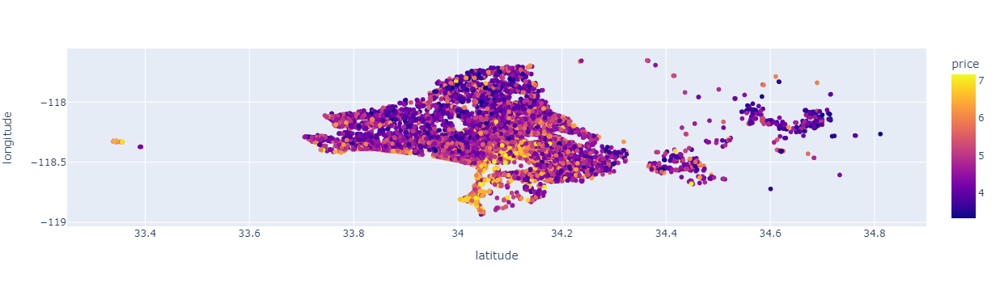

In [148]:
import plotly.express as px
fig = px.scatter(geo, x="latitude", y="longitude", color='price')
fig.show()